### Symulacja Monte Carlo Modelu Isinga

Algorytm Metropolisa dla modelu Isinga bez pola magnetycznego na dwuwymiarowej sieci kwadratowej $L x L$.

In [1]:
import numpy as np
from numba import jit
import matplotlib.pyplot as plt 
from matplotlib.pyplot import figure
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import animation
from IPython.display import HTML
import json

In [3]:
def square_grid(L):
    """
    Zwróć uporządkowany stan początkowy sieci kwadratowej LxL
    """
    LL =np.ones(shape= (L,L), dtype=int) 

    return LL

In [4]:
def square_grid_mess(L):
    """
    Zwróć nieuporządkowany stan początkowy sieci kwadratowej LxL
    """
    LL =np.ones(shape= (L,L), dtype=int) 
    for i in range(L):
        for j in range(L):
            LL[i,j] = np.random.choice([-1,1], p= [0.5, 0.5]) #generuj 1, -1 z prawdopodobieństwem 1/2

    return LL


In [5]:
@jit(nopython=True)
def ising(K,L,T,LL):
    """
    Algorytm metropolisa dla modelu Isinga
    
    Argumenty:
    K - liczba kroków MC
    L - wymiar sieci kwadratowej
    T - temperatura, K_b*T/J
    LL - dwuwymiarowa sieć kwadratowa, stan popczątkowy układu
    """
    
    M = [] #tablica przechowująca magnetyzację po każdym kroku MC

    for i in range(K):
 
        for _ in range(L**2): # jeden krok Monte Carlo

            i, j = np.random.randint(0,L-1), np.random.randint(0,L-1)

            delta_E = 2*LL[i,j] *(LL[(i-1)%L,j] + LL[(i+1)%L, j] + LL[i, (j-1)%L] + LL[i, (j+1)%L])
            
            if delta_E <=0:
                LL[i,j] = -LL[i,j]
            else:
                if np.random.uniform(0,1) < np.exp((-delta_E) /(T)):
                    LL[i,j] =  -LL[i,j]

        M.append( np.sum(LL) / ( L**2 ))
        
    return LL,M

### Konfiguracja spinów dla zadanch rozmiarów sieci kwadratowej i temperatur

In [6]:
def hist_config(file, end_grid, temp, L):
    """
    Zwróć końcowy układu spinów na dwuwymiarowej sieci kwadratowej LxL
    """
    
    fig = figure(figsize = (8,8))
    ax = plt.gca()
    img = ax.imshow(end_grid, interpolation= 'None', cmap= plt.get_cmap('PuBuGn'), vmin=-1, vmax = 1)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.2)
    fig.colorbar(img, cax=cax)
    ax.set_title('     Konfiguracja spinów \n    L={}, T={}'.format(L, temp), fontsize=24, pad =20)
    plt.savefig("config_mess_{}_{}".format(L,str(temp)[0]))
    
    return plt.show()

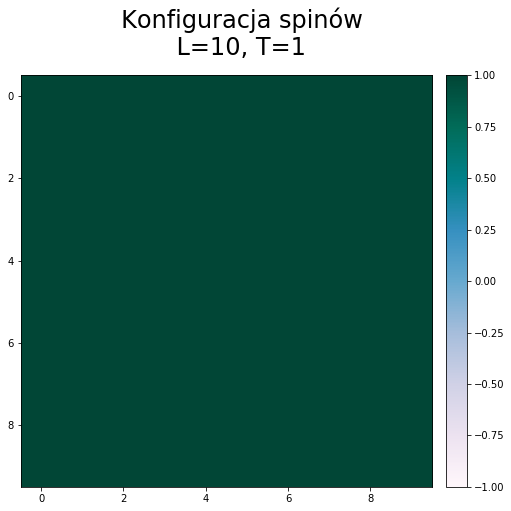

In [147]:
K = 10**6
L = 10
T = 1
start_grid = square_grid(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

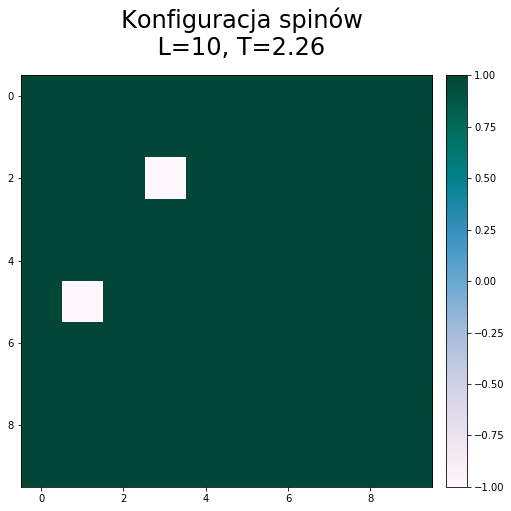

In [148]:
K = 10**6
L = 10
T = 2.26
start_grid = square_grid(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

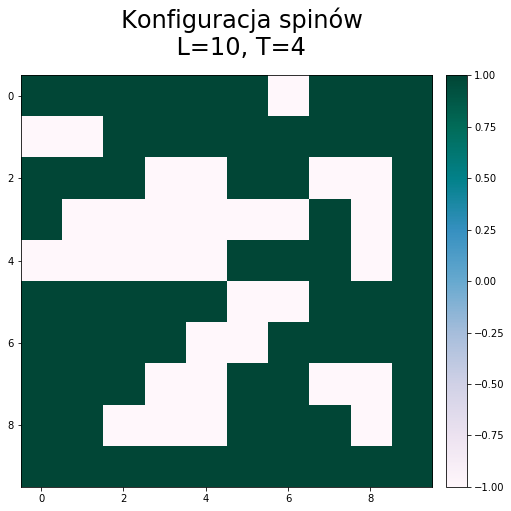

In [149]:
K = 10**6
L = 10
T = 4
start_grid = square_grid(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

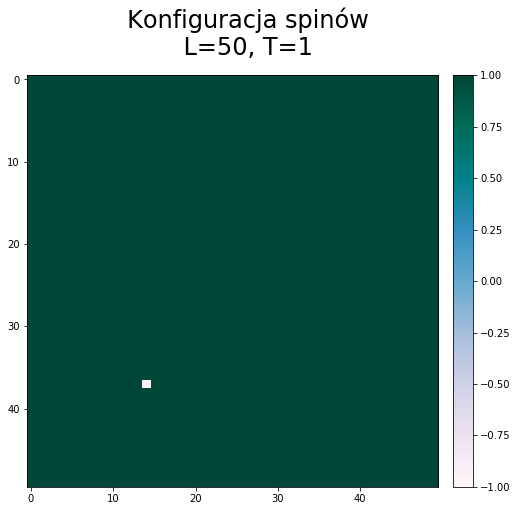

In [150]:
K = 10**6
L = 50
T = 1
start_grid = square_grid(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

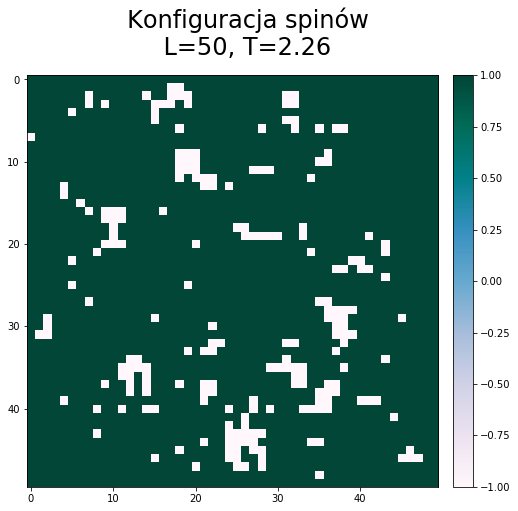

In [151]:
K = 10**6
L = 50
T = 2.26
start_grid = square_grid(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

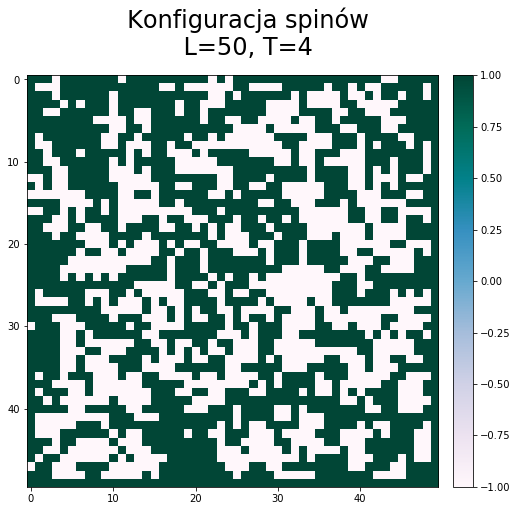

In [152]:
K = 10**6
L = 50
T = 4
start_grid = square_grid(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

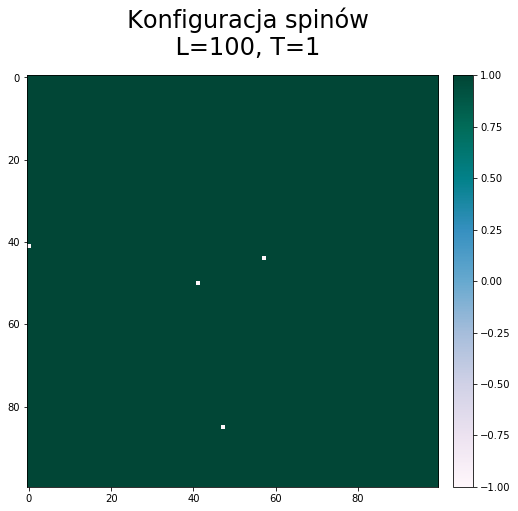

In [153]:
K = 10**6
L = 100
T = 1
start_grid = square_grid(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

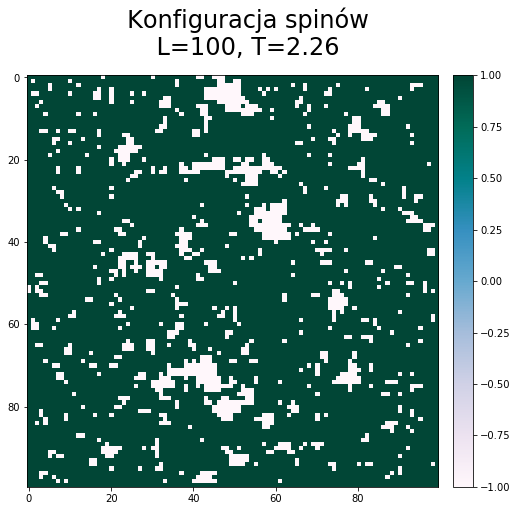

In [154]:
K = 10**6
L = 100
T = 2.26
start_grid = square_grid(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

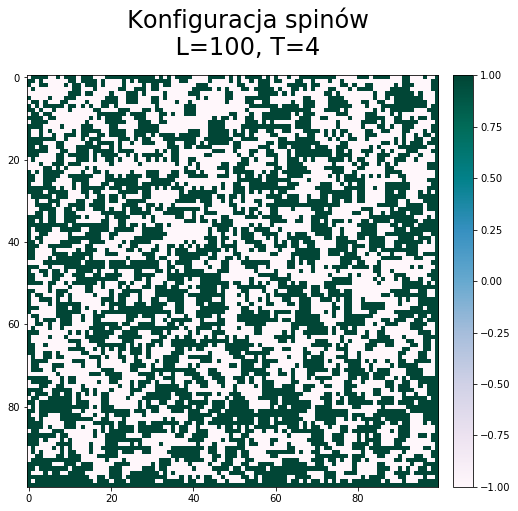

In [156]:
K = 10**6
L = 100
T = 4
start_grid = square_grid(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

### nieuporządkowany stan początkowy

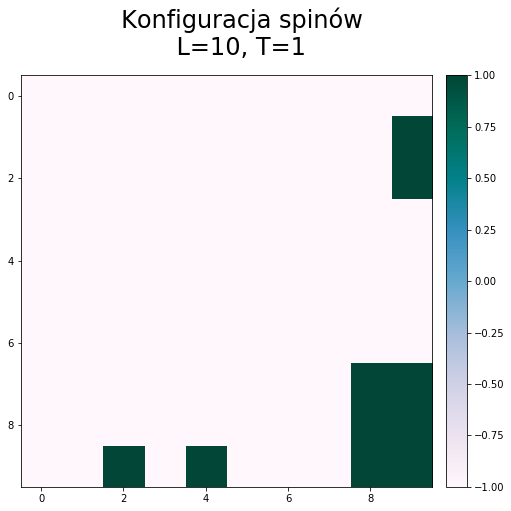

In [283]:
K = 10**6
L = 10
T = 1
start_grid = square_grid_mess(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

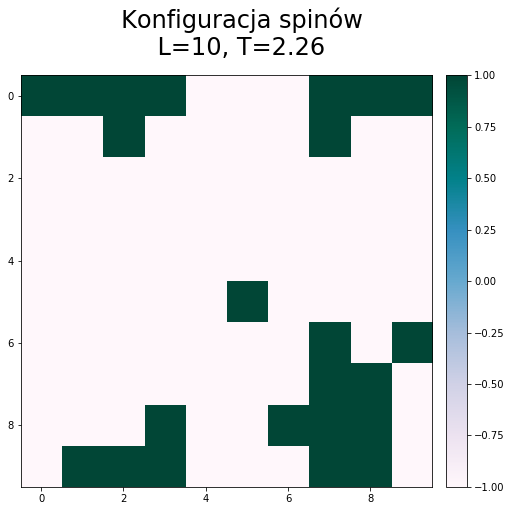

In [284]:
K = 10**6
L = 10
T = 2.26
start_grid = square_grid_mess(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

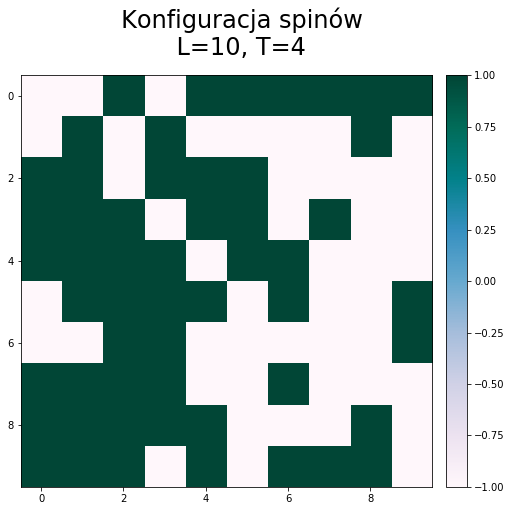

In [285]:
K = 10**6
L = 10
T = 4
start_grid = square_grid_mess(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

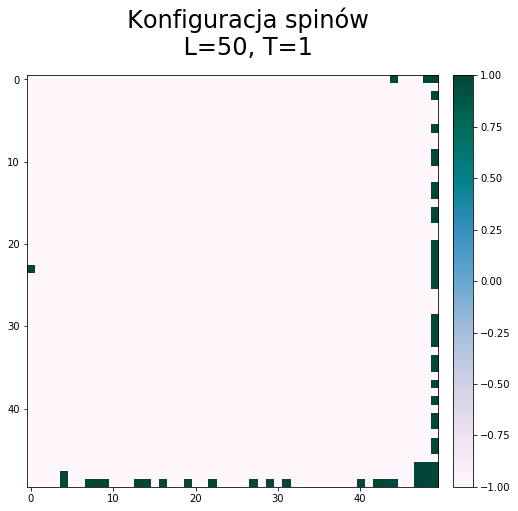

In [290]:
K = 10**6
L = 50
T = 1
start_grid = square_grid_mess(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

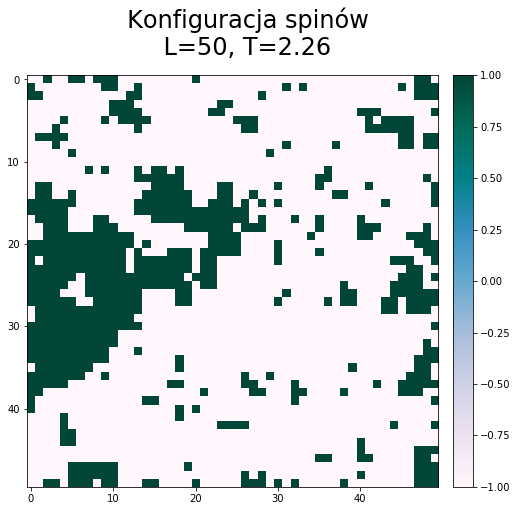

In [287]:
K = 10**6
L = 50
T = 2.26
start_grid = square_grid_mess(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

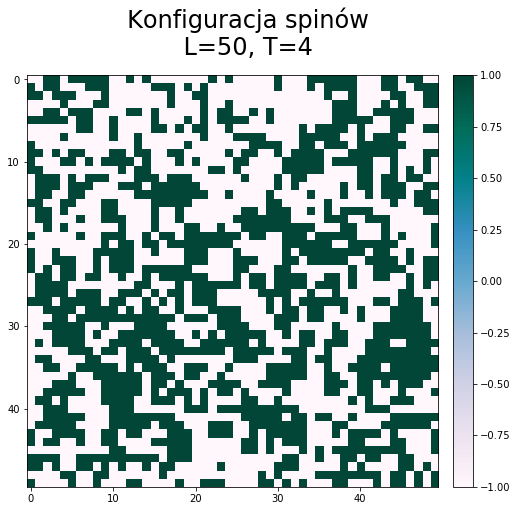

In [288]:
K = 10**6
L = 50
T = 4
start_grid = square_grid_mess(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

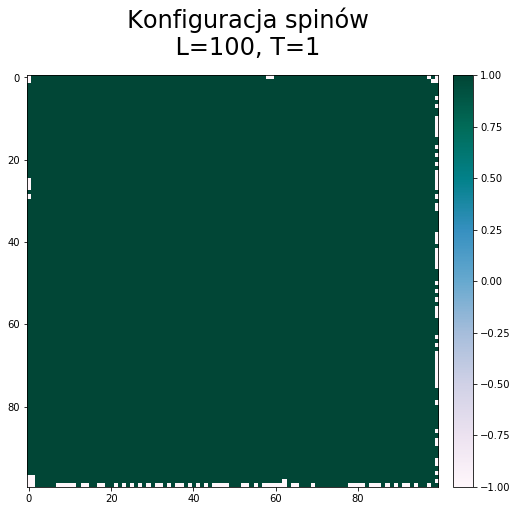

In [295]:
K = 10**6
L = 100
T = 1
start_grid = square_grid_mess(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

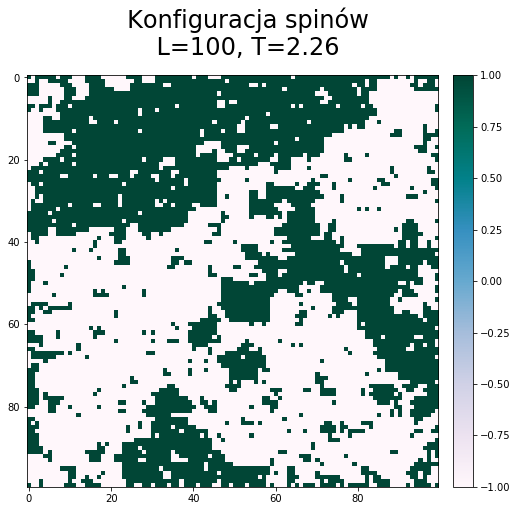

In [308]:
K = 10**6
L = 100
T = 2.26
start_grid = square_grid_mess(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

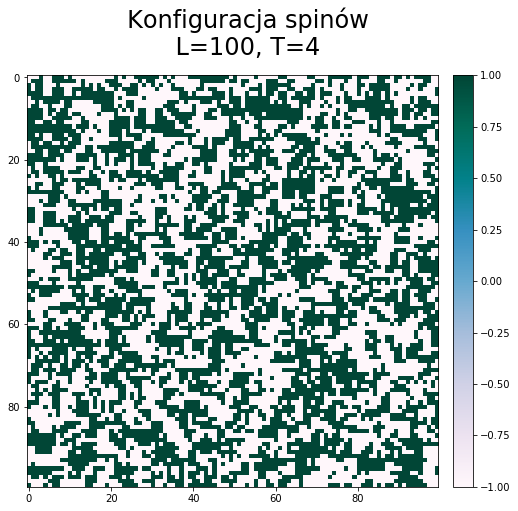

In [315]:
K = 10**6
L = 100
T = 4
start_grid = square_grid_mess(L)
grid = start_grid.copy()
LL, M = ising(K,L,T, grid) 
hist_config(start_grid, LL,T, L)

In [7]:
@jit(nopython=True)
def ising_configs(K,L,T,LL):    
    """
    Algorytm metropolisa dla model Isinga, zwraca kolejne ustawienia sieci kwadratowej
    
    Argumenty:
    K - liczba kroków MC
    L - wymiar sieci kwadratowej
    T - temperatura, K_b*T/J
    LL - dwuwymiarowa sieć kwadratowa, stan popczątkowy układu
    """
    
    All_config = []
    LL_start = LL.copy()
    All_config.append(LL_start)

    for i in range(K):
 
        for _ in range(L**2): # jeden krok Monte Carlo

            i, j = np.random.randint(0,L-1), np.random.randint(0,L-1)

            delta_E = 2*LL[i,j] *(LL[(i-1)%L,j] + LL[(i+1)%L, j] + LL[i, (j-1)%L] + LL[i, (j+1)%L])
            
            if delta_E <=0:
                LL[i,j] = -LL[i,j]
            else:
                if np.random.uniform(0,1) < np.exp((-delta_E) /(T)):
                    LL[i,j] =  -LL[i,j]
        
        LL1 = LL.copy()
        All_config.append(LL1)
        
    return All_config

In [8]:
def animation_ising(K,L, temp,func):
    """
    Zwróc animacje konfiguracji spinów modelu Isinga
    """
    start_grid = func(L)
    grid = start_grid.copy()
    All_LL = ising_configs(K,L,temp, grid)
    
    f= open("anim_{}_{}.txt".format(L,str(temp)[0]),"w")
    for el in All_LL:
        np.savetxt(f, el)
    f.close()
    

    fig = plt.figure(figsize = (8,8))
    ax = plt.gca()
    img = ax.imshow(All_LL[0], vmin=0, vmax=1, cmap= plt.get_cmap('PuBuGn'))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.2)
    ax.set_title("L={}, T={}, MCS={}".format(L,temp, K), fontsize=24, pad=20)
    fig.colorbar(img, cax= cax)

    def animate(i):
        plt.clf()
        ax = plt.gca()
        img = ax.imshow(All_LL[i], vmin=0, vmax=1, cmap= plt.get_cmap('PuBuGn'))
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('right', size='5%', pad=0.2)
        ax.set_title("L={}, T={}, MCS={}".format(L,temp, K), fontsize=24, pad=20)
        fig.colorbar(img, cax= cax)

    anim = animation.FuncAnimation(fig, animate, frames=K, save_count=K)

    anim.save("anim_{}_{}.mp4".format(L,temp), fps=8)
    
    return HTML(anim.to_html5_video())

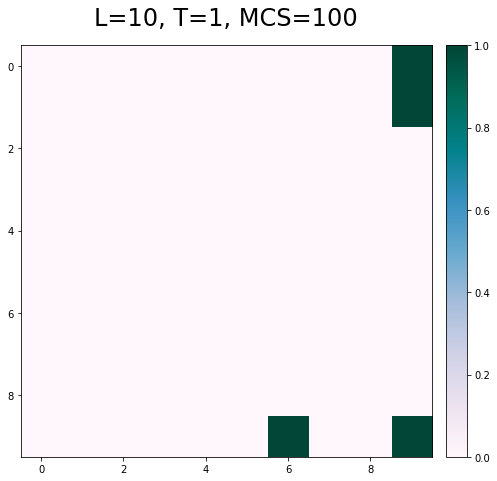

In [93]:
%matplotlib inline
animation_ising(100,10,1,square_grid_mess)

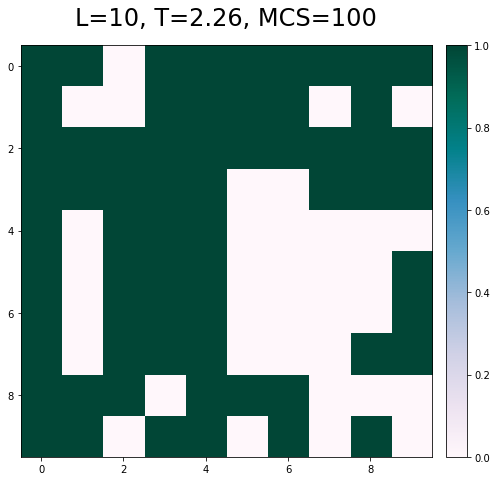

In [94]:
%matplotlib inline
animation_ising(100,10,2.26,square_grid_mess)

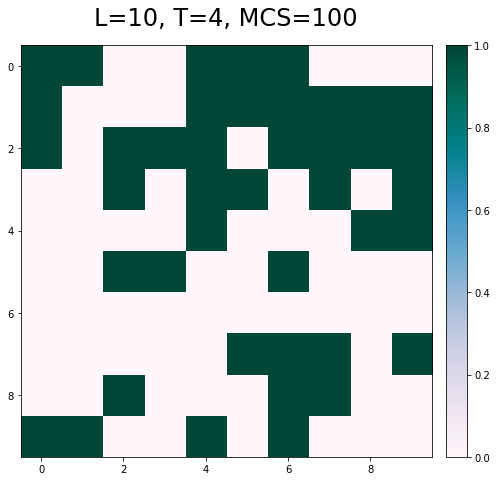

In [95]:
%matplotlib inline
animation_ising(100,10,4,square_grid_mess)

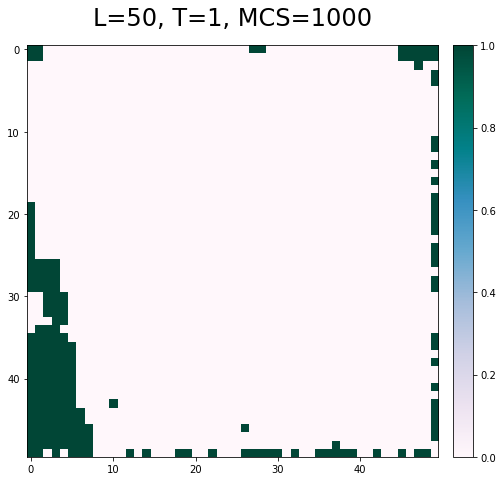

In [116]:
%matplotlib inline
animation_ising(1000,50,1,square_grid_mess)

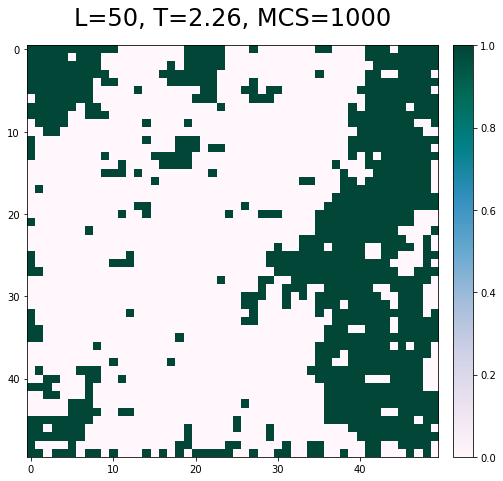

In [117]:
%matplotlib inline
animation_ising(1000,50,2.26,square_grid_mess)

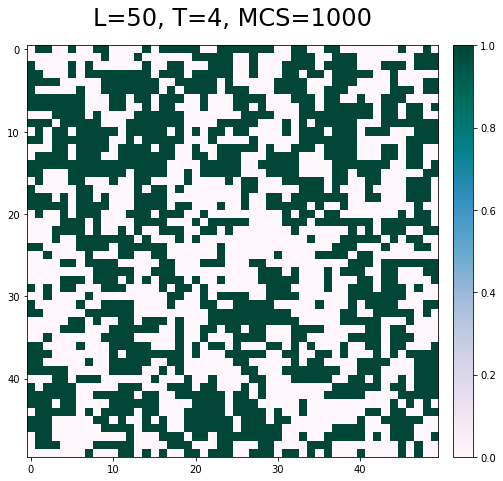

In [118]:
%matplotlib inline
animation_ising(1000,50,4,square_grid_mess)

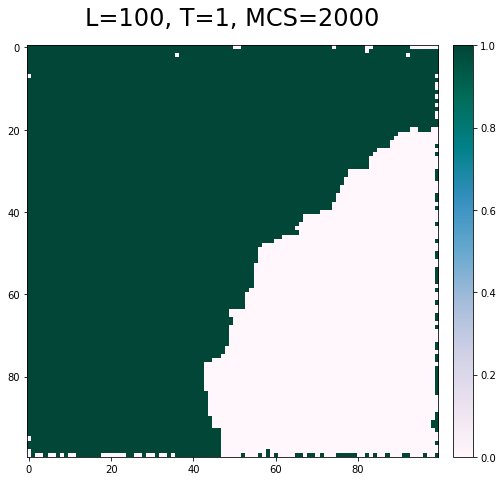

In [97]:
%matplotlib inline
animation_ising(2000,100,1,square_grid_mess)

Animation movie is 28969451 bytes, exceeding the limit of 20971520.0. If you're sure you want a large animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB).


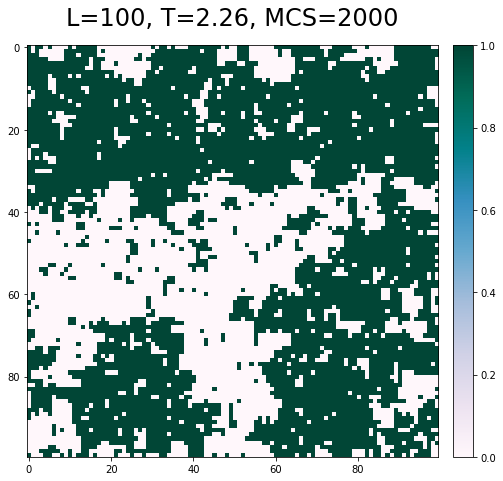

In [119]:
%matplotlib inline
animation_ising(2000,100,2.26,square_grid_mess)

Animation movie is 68170637 bytes, exceeding the limit of 20971520.0. If you're sure you want a large animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB).


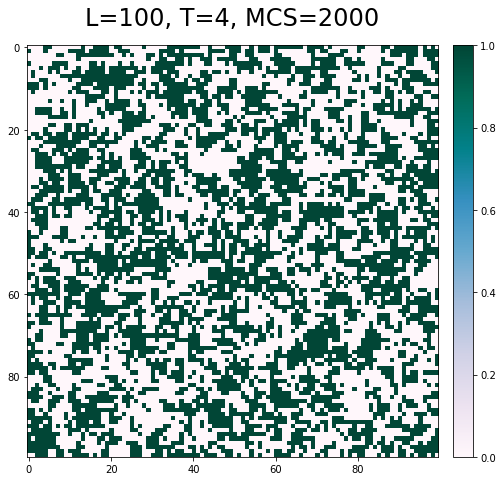

In [115]:
%matplotlib inline
animation_ising(2000,100,4,square_grid_mess)

### Pojedyńcze trajektorie dla temperatury 1.7 dla każdego L

In [9]:
def trajectory(T,L,K, func, name):
    """
    Funkcja generująca dane do wykresów trajektori modelu isinga
    T - temperatura
    L - rozmiar dwuwymiarowej sieci kwadratowej
    K - kroki Monte Carlo
    func - funkcja generująca stan początkowy układu spinów
    name - nazwa pliku do któego zostaną zapisane dane
    """
    
    file = open('trajektoria_{}.json'.format(name) , 'w')
    
    X = []
    
    for i in L:
        start_grid = func(i)
        grid = start_grid.copy()
        LL, M = ising(K,i,T, grid)
        X.append({'{}'.format(i):M}) 

    json.dump(X, file, indent =len(L)+1)
    

In [10]:
def generate_trajectory(file, L):
     """
    Rysuj trajektorie modelu isinga dla uporządkowanego stanu początkowego
    file - plik z danymi
    L - - rozmiar dwuwymiarowej sieci kwadratowej
    """
    
    f= open(file, 'r') 
    data = json.load(f)[0]        
    
    fig = figure(figsize=(15,10))
    
    x = data.get('{}'.format(L))
    plt.plot(np.arange(len(x)), x,'#00664d', label = "L={}".format(L) )
        
    plt.ylim(-1,1)
    plt.title("Trajektoria dla temperatury T*=1.7, L={}".format(L), size=20, pad =20)
    plt.xlabel("t[MCS]", size=12)
    plt.ylabel("m", size=12)
    plt.savefig("trajektoria_{}".format(L))

In [11]:
def generate_trajectory_mess(file, L):
    """
    Rysuj trajektorie modelu isinga dla nieuporządkowanego stanu początkowego
    file - plik z danymi
    L - - rozmiar dwuwymiarowej sieci kwadratowej
    """
    
    f= open(file, 'r') 
    data = json.load(f)        
    
    fig = figure(figsize=(15,10))
      
    for i,j in zip(data,L):
        x = i.get('{}'.format(j))
        plt.plot(np.arange(len(x)), x, label = "L={}".format(j) )
        
    plt.ylim(-1,1)
    plt.title("Trajektorie dla temperatury T*=1.7, L={}".format(L[0]), size=20, pad =20)
    plt.xlabel("t[MCS]", size=12)
    plt.ylabel("m", size=12)
    plt.savefig("trajektoria_mess_{}".format(L[0]))

In [446]:
T  = 1.7
L = [10,10,10,10]
K = 300
trajectory(T,L,K, square_grid_mess, "10_mess")

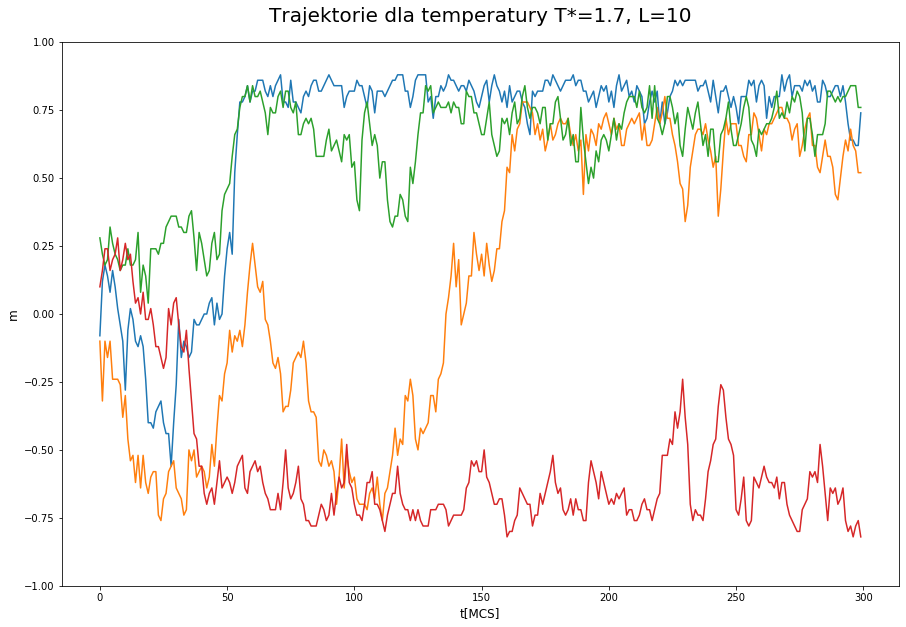

In [461]:
generate_trajectory_mess('trajektoria_10_mess.json',[10,10,10,10])

In [478]:
T  = 1.7
L = [50,50,50,50]
K = 3000
trajectory(T,L,K, square_grid_mess, '50_mess')

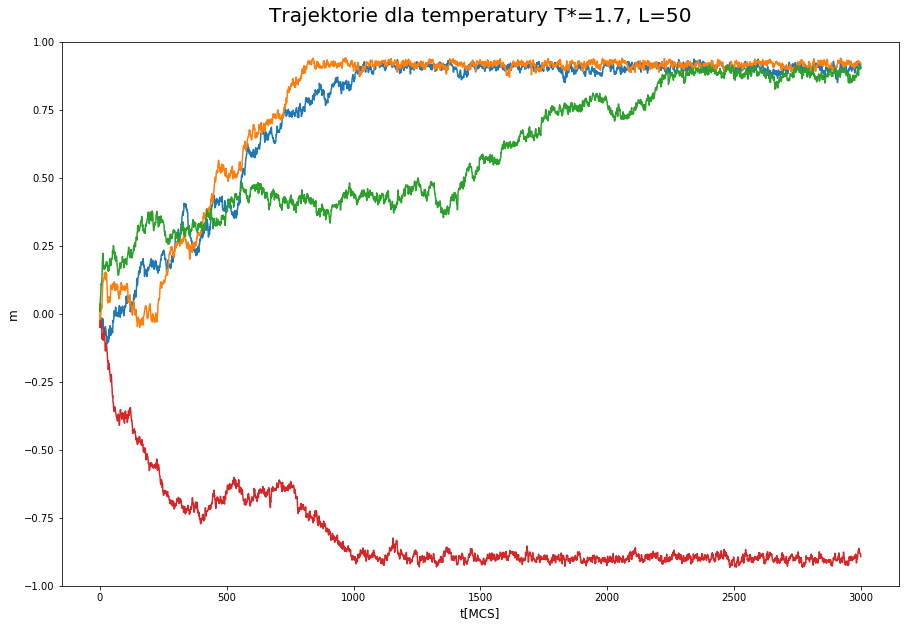

In [479]:
generate_trajectory_mess('trajektoria_50_mess.json',[50,50,50,50])

In [480]:
T  = 1.7
L = [100,100,100,100]
K = 10000
trajectory(T,L,K, square_grid_mess, '100_mess')

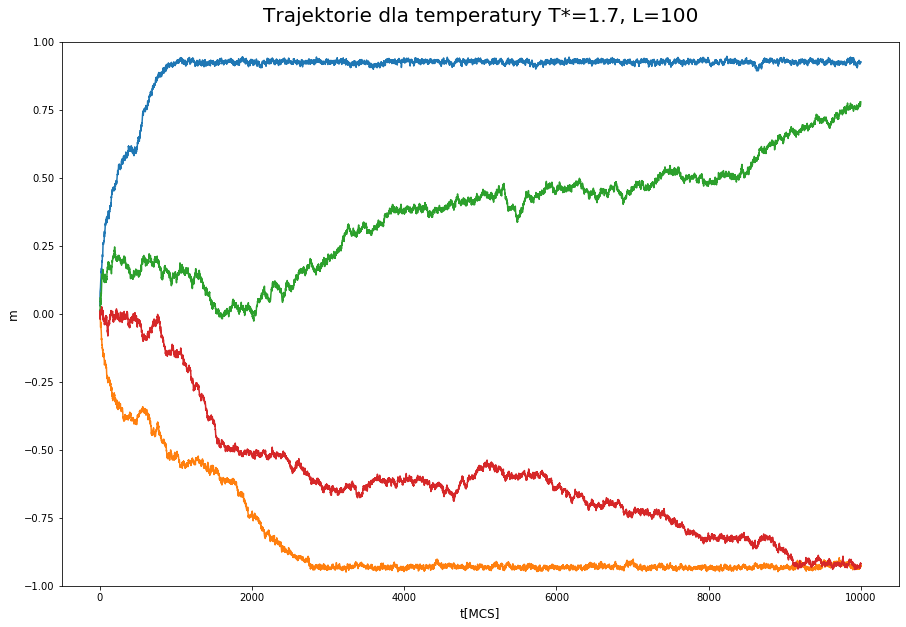

In [481]:
generate_trajectory_mess('trajektoria_100_mess.json',[100,100,100,100])

In [452]:
T  = 1.7
L = [10]
K = 10000
trajectory(T,L,K, square_grid, '10')

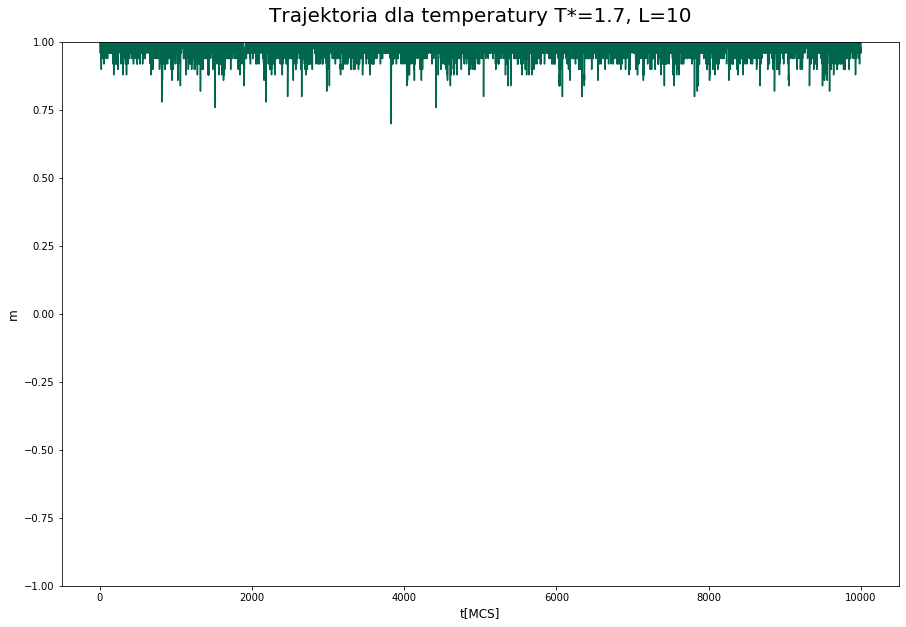

In [464]:
generate_trajectory('trajektoria_10.json',10)

In [455]:
T  = 1.7
L = [50]
K = 10000
trajectory(T,L,K, square_grid, '50')

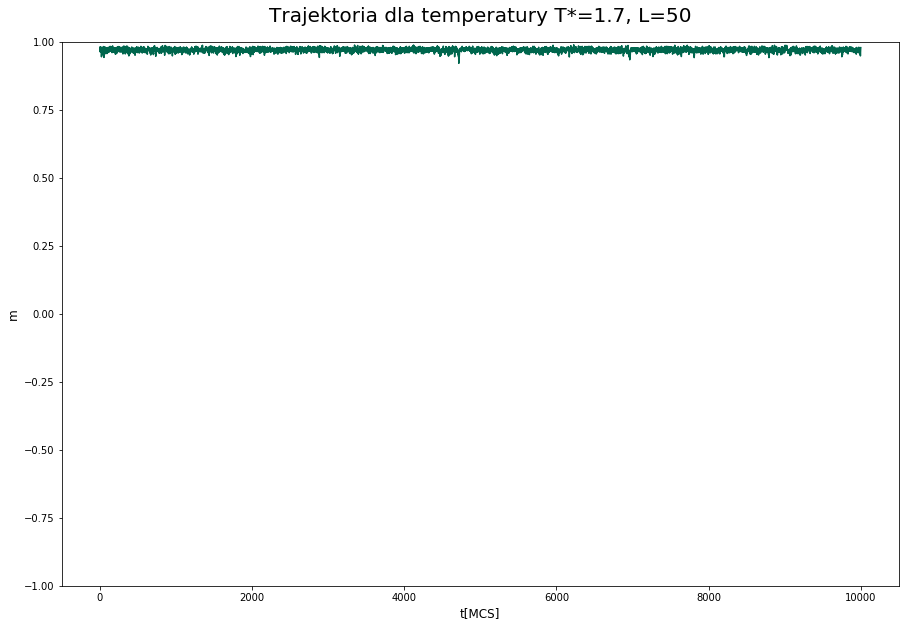

In [465]:
generate_trajectory('trajektoria_50.json',50)

In [457]:
T  = 1.7
L = [100]
K = 10000
trajectory(T,L,K, square_grid, '100')

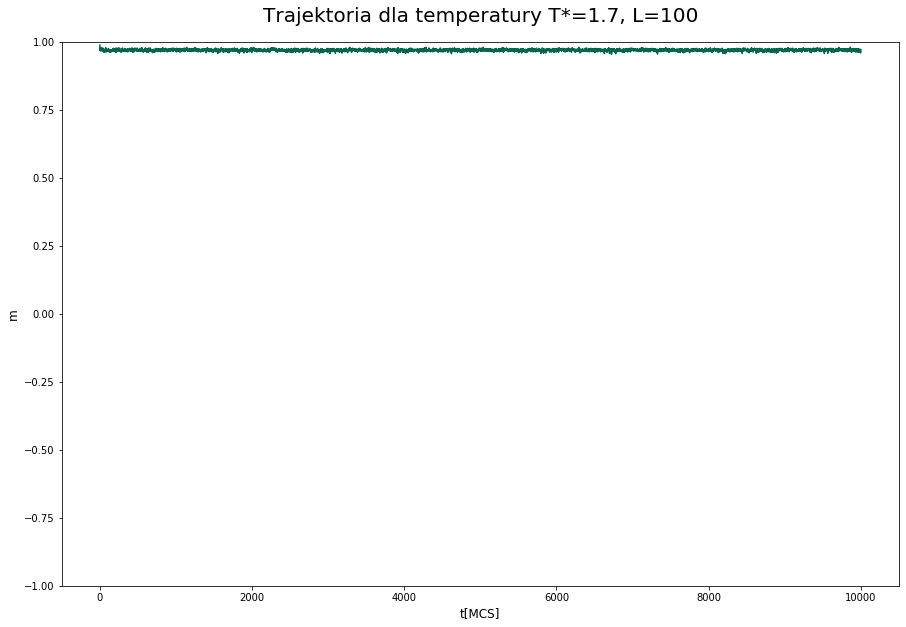

In [466]:
generate_trajectory('trajektoria_100.json',100)

### Magnetyzacja jako funkcja temperatury, $T \in (1,3.5)$

<font size = "5">
$<m> = \frac{1}{l_{sym}} \sum_{j=1}^{l_{sym}} |m_j|$

Do średniej należy wziąć $K - K_0$ kroków, pierwszych $K_0 = 10^4$ to termalizacja.

### Podatność magnetyczna jako funkcja temperatury 

<font size = "5">
$\chi = \frac{N}{k_BT}(<m^2> - <m>^2)$

In [12]:
def magnetization():
    """
    Funckja licząca magnetyzacje oraz podatność magentyczną oraz zapisująca dane do pliku
    """
    
    T = list(np.linspace(1,2,5)) + list(np.linspace(2,2.75,15)) + list(np.linspace(2.75,3.5,5))
    
    L = [10,50,100]
    
    M_mean = []
    P = []
    
    K=10**6
    K_0 = 10**4
    
    Mag = []
    Pod = []
                
    m_file = open('mag.json', 'w')
    p_file = open('pod.json', 'w')
    
    for i in L:
        M_mean = []
        P = []
        for temp in T:
            
            start_grid = square_grid(i)
            grid = start_grid.copy()
            LL, M = ising(K,i,temp, grid)
            
            m = sum([abs(i) for i in M[K_0:]])/(K-K_0)
            m2 = sum([abs(i)**2 for i in M[K_0:]])/(K-K_0)
            
            M_mean.append(m)
            
            p = (i**2 /temp )*(m2 - m**2)
            P.append(p)
                   
        Mag.append({'{}'.format(i):M_mean})
        Pod.append({'{}'.format(i): P})
        
     
    json.dump(Mag, m_file, indent=4)
    json.dump(Pod, p_file, indent=4)
                    
    p_file.close()
    m_file.close() 
        
    return  

In [36]:
magnetization()

In [29]:
def generate_plot_mag(file):    
    """
    Rysuj wykres magnetyzacji od temperatury dla modelu Isinga
    file - plik z danymi
    """
    
    f= open(file, 'r') 
    data = json.load(f)        
    
    fig = figure(figsize=(15,10))
    
    T = list(np.linspace(1,2,5)) + list(np.linspace(2,2.75,15)) + list(np.linspace(2.75,3.5,5))
    for i,j in zip(data, [10,50,100]):
        plt.plot(T, i.get('{}'.format(j)), '-o', label = "L={}".format(j) )
        
    plt.legend()
    plt.title("Magnetyzacja", size=25, pad =20)
    plt.ylabel("<m>", size=15)
    plt.xlabel("T*", size=15)
    plt.savefig("punkt_3")
       
    return plt.show() 

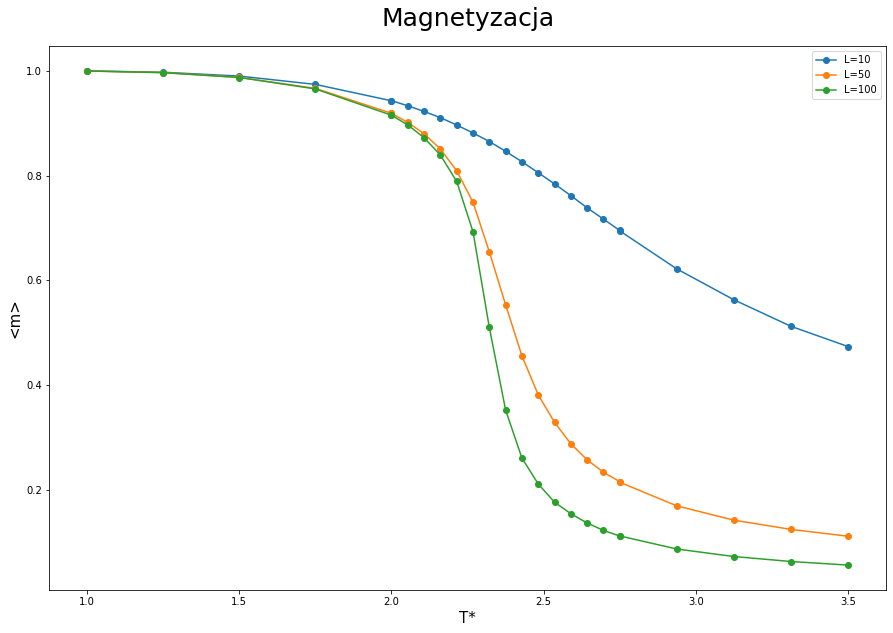

In [37]:
generate_plot_mag('mag.json')

In [38]:
def generate_plot_pod(file):    
    """
    Rysuj wykres podatności magentycznej od temperatury dla modelu Isinga
    file - plik z dany
    """
    
    f= open(file, 'r') 
    data = json.load(f)        
    
    fig = figure(figsize=(15,10))
    
    T = list(np.linspace(1,2,5)) + list(np.linspace(2,2.75,15)) + list(np.linspace(2.75,3.5,5))
    for i,j in zip(data, [10,50,100]):
        plt.plot(T, i.get('{}'.format(j)), '-o', label = "L={}".format(j) )
        
    plt.legend()
    plt.title("Podatność magnetyczna", size=25, pad =20)
    plt.ylabel(r"$\chi$", size=15)
    plt.xlabel("T*", size=15)
    plt.savefig("punkt_4")
       
    return plt.show() 

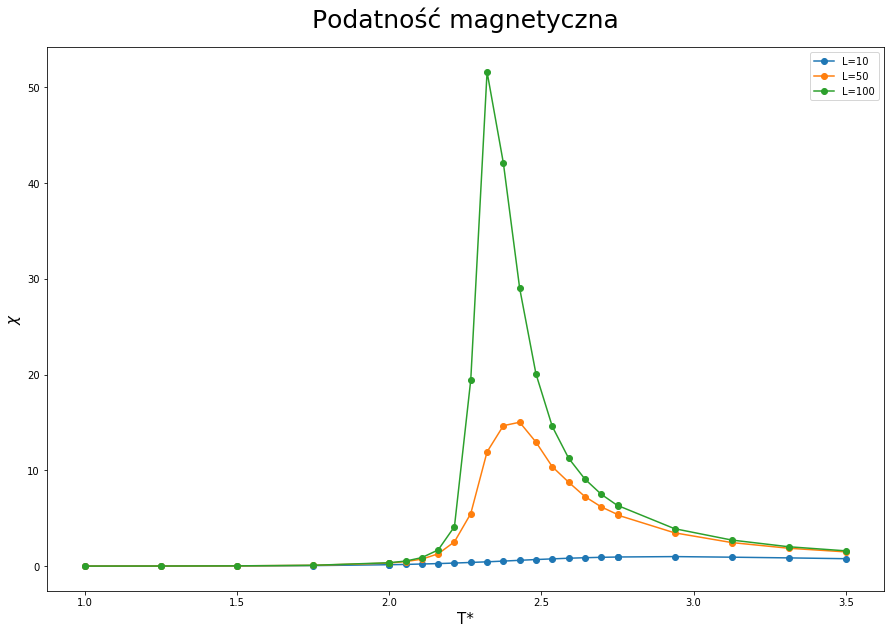

In [39]:
generate_plot_pod('pod.json')